# Research of the cafe market in Moscow to select a new place.

**Research task:**

Prepare a study of Moscow for fund investors (big fans of Friend sitcom) who have decided to try themselfs in a new area and open some kind of establishment, find interesting features and present the results that will help in the future in choosing a suitable place for investors, what will be the location, menu and prices. 


**Research plan:**

[**1. Load libraries and explore general information**](#first)
-  [1.1. Conclusions from data description.](#first1)

[**2. Data preprocessing**](#second)
-  [2.1. Preprocessing conclusions](#second1)

[**3. EDA**](#third)
-  [3.1  Establishment categories](#third1)
-  [3.2  Number of seats](#third2)
-  [3.3  Ratio of chain and non-chain establishments](#third3)
-  [3.4  Which categories are more likely to be a chain](#third4)
-  [3.5  What are the most popular restaurant chains in Moscow](#third5)
-  [3.6  What administrative regions do we have](#third6)
-  [3.7  Category average rating](#third7)
-  [3.8  Cartogram of average rating by regions](#third8)
-  [3.9  Add establishments using clusters](#third9)
-  [3.10 Top-15 streets by number of establishments](#third10)
-  [3.11  Street with only one establishment](#third11)
-  [3.12  Average bill by regions](#third12)
-  [3.13 EDA conclusions](#third13)

[**4. Detailing research: opening a coffee shop**](#fourth)
-  [4.1. Conclusion about opening a coffee shop](#fourth1)

[**5. Presentation**](#fifth)

## 1. Load libraries and explore general information<a class="anchor" id="first"></a>

In [1]:
#!pip install folium as folium

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
import numpy as np
import datetime as dt
import plotly.express as px
from plotly import graph_objects as go
import re
import folium
import json

In [3]:
sea.set_palette("colorblind")
sea.set_style("whitegrid")

In [4]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/Users/lqbaha/Downloads/datasets/moscow_places.csv')

In [5]:
data = data.reset_index()

In [6]:
data.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              8406 non-null   int64  
 1   name               8406 non-null   object 
 2   category           8406 non-null   object 
 3   address            8406 non-null   object 
 4   district           8406 non-null   object 
 5   hours              7870 non-null   object 
 6   lat                8406 non-null   float64
 7   lng                8406 non-null   float64
 8   rating             8406 non-null   float64
 9   price              3315 non-null   object 
 10  avg_bill           3816 non-null   object 
 11  middle_avg_bill    3149 non-null   float64
 12  middle_coffee_cup  535 non-null    float64
 13  chain              8406 non-null   int64  
 14  seats              4795 non-null   float64
dtypes: float64(6), int64(2), object(7)
memory usage: 985.2+ KB


In [8]:
data['chain'] = data['chain'].astype(bool)

### 1.1. Conclusions from data description<a class="anchor" id="first1"></a>

We have access to a dataset with catering establishments in Moscow, complied on the basis of data from Yandex Maps and Yandex Business services from the summer of 2022. This information posted in the Yandex Business service could have been added by users or found in public sources, it is for informational purposes.

In total we have 8406 public catering establishments in the city of Moscow, information by columns: 


* `name` — name of establishment;
* `address`;
* `category` — category of establishment, such as "cafe", "pizzeria" or coffee shop;
* `hours` — information about working days and hours;
* `lat` — the latitude of the geographic point where the establishment is located;
* `lng` — longitude of the geographic point where the establishment is located;
* `rating` — rating of the stablishment according to users ratings in Yandex Maps (the highest — 5.0);
* `price` — the category of prices, for example, "average", "below average", "expensive" and etc;
* `avg_bill` — text with average order value as a range:
  - «Average bill: 1000–1500 ₽»;
  - «The price of a cappuccino cup: 130–220 ₽»;
  - «The price of a glass of beer: 400–600 ₽».
  - etc;
* `middle_avg_bill` — number with an average bill etimate, which is indicated only for values from the `avg_bill` column that begin with the substring "Average bill":
  - If the string contains a price range of two values, the column will include the median of these two values.
  - If the string contains one number - the price without a range, then this number will be included in the column.
  - If there is no value or it does not start with the substring "Average bill", then nothing will be included in the column.
* `middle_coffee_cup` — number with an average bill estimate, which is indicated only for values from the `avg_bill` column that begin with the substring "The price of a cappuccino cup":
  - If the string contains a price range of two values, the column will include the median of these two values.
  - If the string contains one number - the price without a range, then this number will be included in the column.
  - If there is no value or it does not start with the substring "The price of a cappuccino cup", then nothing will be included in the column.
* `chain` — the number, expressed as 0 or 1, that indicates whether the establishment is in a chain (errors may occur for small chains);
* `district` — the administrative region in which the establishment is located, such as Central Administrative District;
* `seats` — seating capacity.

Almost all the data we have is type of Object (sting). Longitude, latitude, rating and average prices are real numbers (float).


Data in the `chain` column - converted to boolean format (was numeric).

## 2. Data preprocessing<a class="anchor" id="second"></a>

In [9]:
#check for missing values

data.isna().sum()

index                   0
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [10]:
round(data.isna().sum()/data.shape[0] * 100)

index                 0.0
name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.0
lat                   0.0
lng                   0.0
rating                0.0
price                61.0
avg_bill             55.0
middle_avg_bill      63.0
middle_coffee_cup    94.0
chain                 0.0
seats                43.0
dtype: float64

In total we have 8406 establishments in Moscow in our work, there are a lot of missing values, and they are present in the columns: 

 - the most amount of missing values - 94% - `middle_coffee_cup`;
 - 63% missing values in `middle_avg_bill`;
 - 61% missing values in `price`;
 - 55% missing values in `avg_bill`;
 - 43% missing values in `seats`
 
We will not do anything with missings now, the percentage of the entire dataset is too large, we will see futher if this will affect our calculations. 

In [11]:
#check for duplicates 

data.duplicated().sum()

0

At least there are no obvious duplicates. 


Now let's create two more columns: 
- `street` - extract the street name separately from the column with address
- `is_24/7` with the designation that the establishment is open 24/7 (True/False).

And we will convert all text values to lowercase and check for implicit duplicates. 

In [12]:
data['street'] = data['address'].str.split(', ').str[1].str.strip()

In [13]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [14]:
data['address'] = data['address'].str.lower()

In [15]:
data['name'] = data['name'].str.lower()

In [16]:
#check unique names

data["name"].unique()
#print(data["name"].sort_values().unique().tolist())

array(['wowфли', 'четыре комнаты', 'хазри', ..., 'миславнес', 'самовар',
       'kebab time'], dtype=object)

In [17]:
#check unique streets

data["street"].unique()
#print(data["street"].sort_values().unique().tolist())

array(['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко',
       ..., 'улица Хлобыстова', 'Новороссийская улица',
       'Чонгарский бульвар'], dtype=object)

In [18]:
data["street"] = data["street"].replace("ул. профсоюзная", "профсоюзная улица")

In [19]:
data["street"] = data["street"].replace("ул. ярославская", "ярославская улица")

In [20]:
data["name"] = data["name"].replace("ресторан ярославский", "ярославский")

In [21]:
data.head(3)

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,улица Дыбенко,False
1,1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко,False
2,2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,Клязьминская улица,False


### 2.1. Preprocessing conclusions<a class="anchor" id="second1"></a>

In total we have 8406 establishments in Moscow in our work, there are a lot of missing values, and they are present in the columns: 

 - the most amount of missing values - 94% - `middle_coffee_cup`;
 - 63% missing values in `middle_avg_bill`;
 - 61% missing values in `price`;
 - 55% missing values in `avg_bill`;
 - 43% missing values in `seats`

We will not do anything with missings now, the percentage of the entire dataset is too large, we will see futher if this will affect our calculations.

There are no obvious duplicates, but a few implicit ones were found and removed. 

Additional columns with street name and True/False value, whether the establishment is open 24/7 have been created.

## 3. EDA<a class="anchor" id="third"></a>


### 3.1.  Establishment categories<a class="anchor" id="third1"></a>

In [22]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

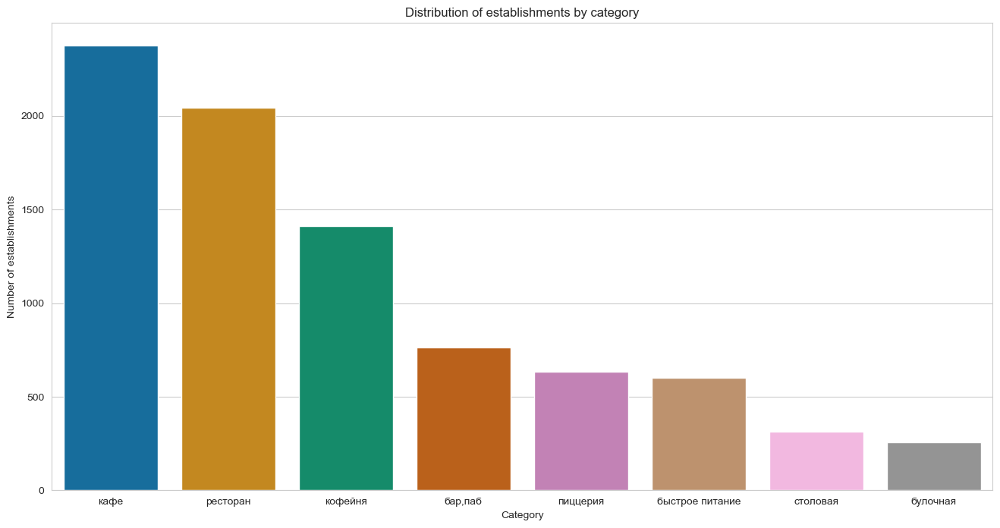

In [23]:
plt.figure(figsize=(16,8))
ax = sea.barplot(data=data.groupby('category')['index'].count().reset_index().sort_values('index', ascending=False),
            x='category', 
            y='index')
plt.title("Distribution of establishments by category")
plt.xlabel("Category")
plt.ylabel("Number of establishments")
plt.show()

In total we have 8 categories of catering establishments: 
- cafe, amount 2378 (smaller and simpier than restaurant, less cloice, coffee-snacks-lunches)
- restaurant, amount 2043 (higher level of service and food quality, focus on longer stays)
- coffee shop, кол-во 1413 (focus on coffee and pastires, often take-away orders)
- bar, pub, amount 765 (alcohol specialization)
- pizzeria, amount 633 (restaurant/cafe with one type of food)
- fast food, amount 603 (often takeaway orders, are concentrated in shopping centers)
- eatery, amount 315 (self-service catering format, unlike fast food - the cousien is more like home) 
- bakery, amount 256 (specialization in baking, but recently bakeries have become like coffee houses in reverse: more pastries, less coffee)

Now let's look at the pie chart with percentage.

In [24]:
data_pie=data.groupby('category')['index'].count().reset_index()

In [25]:
colors = ['darkblue', 'lightblue', 'lightcyan', 'darkred', 'royalblue', 'pink', 'turquoise', 'darkgreen', 'magenta']

fig = go.Figure(data=[go.Pie(labels=data_pie['category'], 
                             values=data_pie['index'])])
fig.update_traces(marker=dict(
                  colors=colors))

fig.update_layout(
    title_text="Distribution of establishments by category, %")

fig.show() 

We can already see the share percentages of establishment categories: 

**1. Type Cafe we have 28,3% of the researched area.**

**2. On the second place - Restaurant - 24,3%**

**3. On the third - Coffee Shop - 16,8%*

4. Bar, Pub - 9,1% 4-th
5.-6.-7.-8. - Pizzeria(9%), Fast food(7,5%), Eatery(3,75%), Bakery(3%). 


### 3.2.  Number of seats<a class="anchor" id="third2"></a>


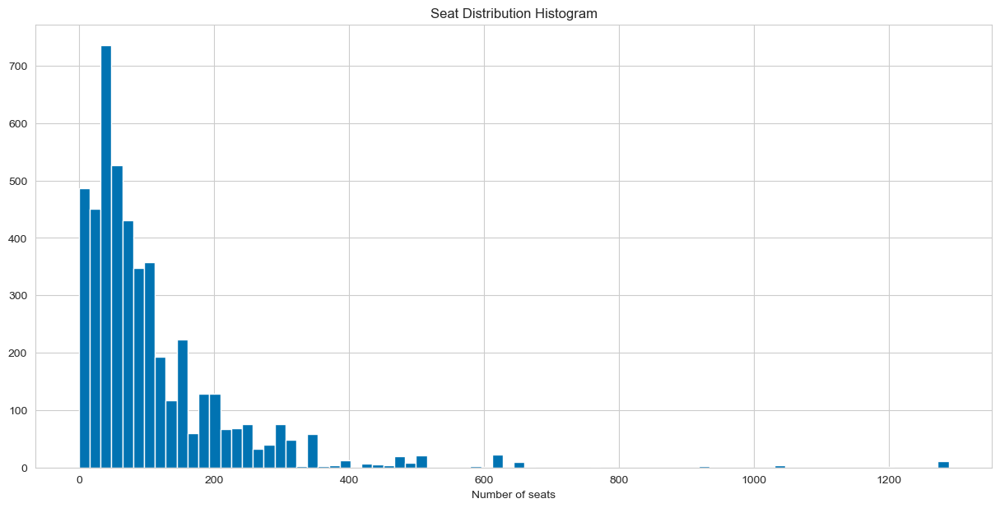

In [26]:
plt.figure(figsize = (15, 7))
data['seats'].hist(bins = 80)
plt.title("Seat Distribution Histogram") 
plt.xlabel('Number of seats')
plt.show()

Let's investigate the number of seats for each category. We will use median value, since there are many missing values and outliers, and the data is not very even across this column

In [27]:
seats_median = data.groupby('category').agg({'seats':'median'}).reset_index().round()
seats_median.sort_values('seats', ascending= False)

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,76.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


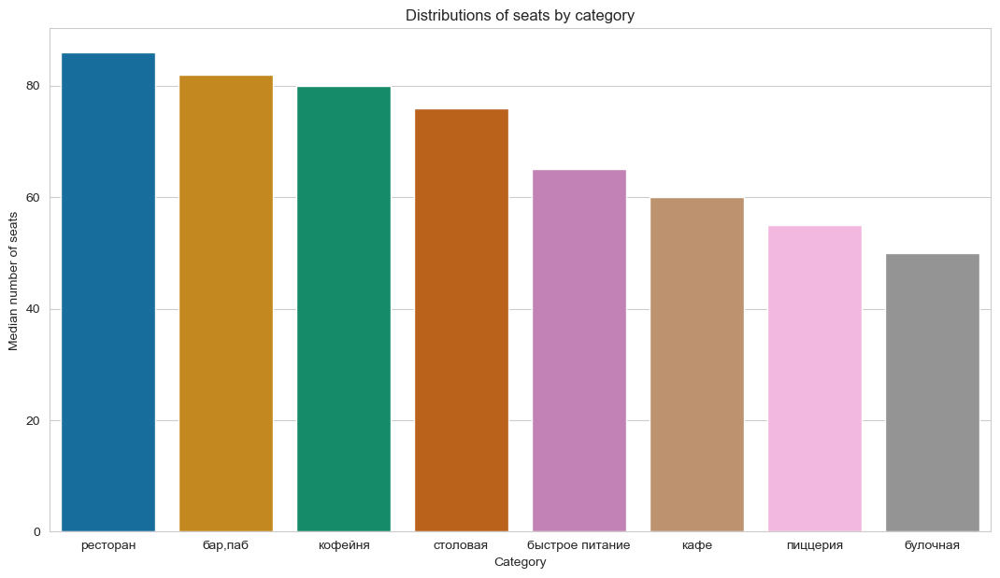

In [28]:
plt.figure(figsize=(13,7))
ax = sea.barplot(data=seats_median.sort_values('seats', ascending=False), 
            x='category', 
            y='seats')
plt.title("Distributions of seats by category")
plt.xlabel("Category")
plt.ylabel("Median number of seats")
plt.show()

The most number of seats is required for establishments such as Restaurant, Bar/Pub, Coffee Shop and Eatery.


And less if for Fast Food, Cafes, Pizzerias and Bakeries (remember, that these categories are often for takeaway).

###  3.3.  Ratio of chain and non-chain establishments<a class="anchor" id="third3"></a>

In [29]:
colors = ['lightblue', 'darkred']

fig = go.Figure(data=[go.Pie(labels=['Non-chain', 'Chain'], 
                             values=data['chain'].value_counts().to_list(),
                             pull=[0.1, 0])])
fig.update_layout(
    title_text="The ration of chain and non-chain establishments")

fig.update_traces(marker=dict(
                  colors=colors))

fig.show() 

There are more non-chain stablishments than chain ones in the ration of 62% to 38%. 

### 3.4.  Which categories are more likely to be a chain<a class="anchor" id="third4"></a>

In [30]:
data_all = data.pivot_table(
    index='category', 
    values='index', 
    aggfunc='count').reset_index().sort_values('category')
data_all.columns = ['category', 'count']

In [31]:
data_chain = data.query('chain ==  True').pivot_table(
    index='category', 
    values='index', 
    aggfunc='count').reset_index().sort_values('category')
data_chain.columns = ['category', 'count']
data_chain['share'] = round(data_chain['count']/data_all['count']*100, 2)
data_chain

,category,count,share
0,"бар,паб",169,22.09
1,булочная,157,61.33
2,быстрое питание,232,38.47
3,кафе,779,32.76
4,кофейня,720,50.96
5,пиццерия,330,52.13
6,ресторан,730,35.73
7,столовая,88,27.94


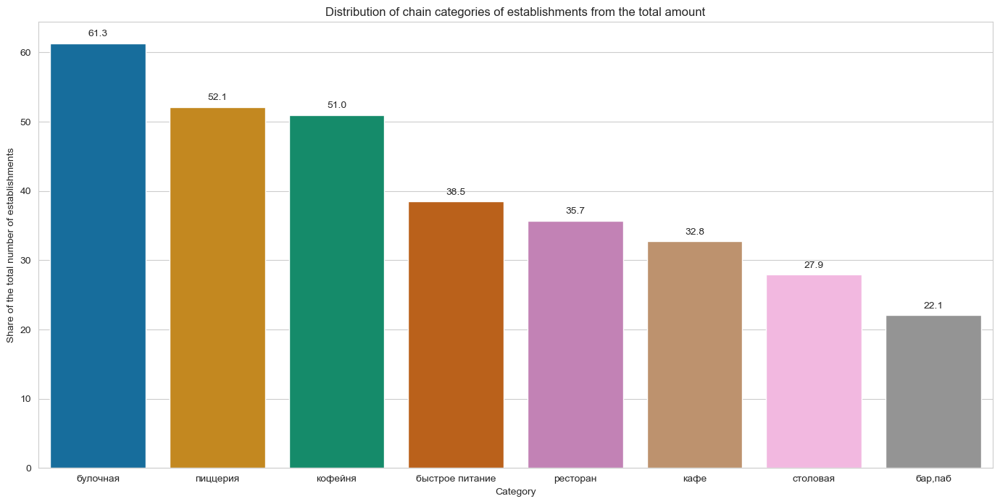

In [32]:
plt.figure(figsize=(17,8))
ax = sea.barplot(data=data_chain.sort_values('share', ascending=False),
            x='category', 
            y='share')
plt.title("Distribution of chain categories of establishments from the total amount")
plt.xlabel("Category")
plt.ylabel("Share of the total number of establishments")

for g in ax.patches:
    ax.annotate(format(g.get_height(), '.1f'),
                   (g.get_x() + g.get_width() / 2., g.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 9),
                   textcoords = 'offset points')

plt.show()

The chain establishments are most often: 
- Bakery
- Pizzeria
- Coffee shop
- Fast food

### 3.5. What are the most popular restaurant chains in Moscow<a class="anchor" id="third5"></a>

In [33]:
data_top15_chain = data.query('chain ==  True')
data_top15_chain = data_top15_chain.groupby(['name']).agg(
    {'index' : 'count'}).sort_values(
    by='index', ascending=False).head(15).reset_index()
data_top15_chain

,name,index
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


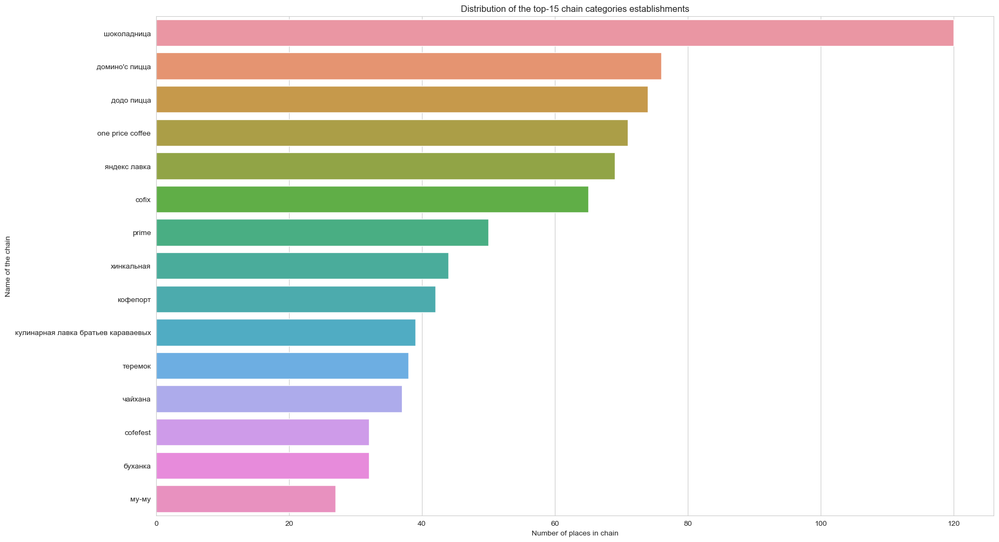

In [34]:
plt.figure(figsize=(20,12))
ax = sea.barplot(data=data_top15_chain,
            y='name', 
            x='index')
plt.title("Distribution of the top-15 chain categories establishments")
plt.ylabel("Name of the chain")
plt.xlabel("Number of places in chain")

plt.show()

In total we have 816 establishments in the top-15 chains in Moscow, which is about 10% of the entire dataset. 

All of them spezialize in residents of the megacity, who have no time to cook, and food is needed for the office, food is needed at home, food can be easily and affordably get. 


Out total rating: 

- Chocoladnitsca - huge chain with business lunches, coffee and quiet atmosphere
- Domino's pizza - focus on delivery
- Dodo pizza - focus on delivery
- One Price Coffee - takeaway coffee
- Yandex Lavka - food and grocery delivery
- Cofix - takeaway coffee
- Prime - healthy and unusual type for office lunches
- Khinkalnaya - a georgian cousine chain with beautiful and delicious restaurants, but this format is also very often ordered with delivery
- Coffeeport - takeaway coffee
- Culinary shop of the Karavaev brothers - very nice and tasty format of eatery
- Teremok - russian folk fast food
- Chaihana - like a khinkalnaya, very popular and also delivery
- CofeFest - takeaway coffee
- Buhanka - bakery + takeaway coffee
- Mu-Mu - eatery


In [35]:
#make a list with the names of the top-15 chains

top15_list = list(data_top15_chain['name'])

In [36]:
data_top = data.query('name in @top15_list')
data_top.head(3)

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,True,180.0,Базовская улица,False
23,23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,True,NaN,Лобненская улица,False
32,32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,True,46.0,Коровинское шоссе,False


In [37]:
data_top.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 818 entries, 13 to 7981
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              818 non-null    int64  
 1   name               818 non-null    object 
 2   category           818 non-null    object 
 3   address            818 non-null    object 
 4   district           818 non-null    object 
 5   hours              803 non-null    object 
 6   lat                818 non-null    float64
 7   lng                818 non-null    float64
 8   rating             818 non-null    float64
 9   price              242 non-null    object 
 10  avg_bill           391 non-null    object 
 11  middle_avg_bill    253 non-null    float64
 12  middle_coffee_cup  138 non-null    float64
 13  chain              818 non-null    bool   
 14  seats              531 non-null    float64
 15  street             818 non-null    object 
 16  is_24/7            803 n

In [38]:
data_top15_category = data_top.groupby(['category']).agg(
    {'index' : 'count'}).sort_values(
    by='index', ascending=False).reset_index()
data_top15_category['share'] = round(data_top15_category['index']/ len(data_top15_category), 2)

data_top15_category

,category,index,share
0,кофейня,337,42.12
1,ресторан,186,23.25
2,пиццерия,152,19.00
3,кафе,100,12.50
4,булочная,25,3.12
5,быстрое питание,12,1.50
6,"бар,паб",4,0.50
7,столовая,2,0.25


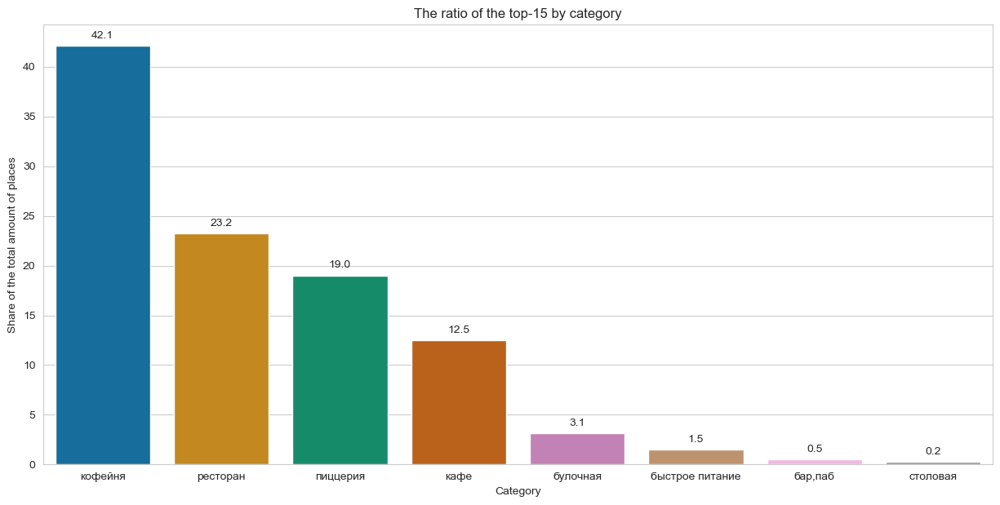

In [39]:
plt.figure(figsize=(15,7))
ax = sea.barplot(data=data_top15_category.sort_values('share', ascending=False),
            x='category', 
            y='share')
plt.title("The ratio of the top-15 by category")
plt.xlabel("Category")
plt.ylabel("Share of the total amount of places")

for g in ax.patches:
    ax.annotate(format(g.get_height(), '.1f'),
                   (g.get_x() + g.get_width() / 2., g.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 9),
                   textcoords = 'offset points')

plt.show()

Distribution by categories: 

* 42% - Coffee shops, 
* 23% - Restaurants, 
* 19% - Pizzas, 
* and 12,5% - Caffee.

But we noticed that different places of the same chain appear in different categories. 

And for example, Yandex Lavka, which works only for the delivery products, is considered a restaurant. 

In [40]:
#create a dataset with information about districts, categories and number of establishments

data_top_district_category = data_top.groupby(['district', 'category'])['index'].agg('count')\
                                       .reset_index().sort_values(by='index', ascending=False)

In [41]:
#calculate the percentage

percentage_data = data_top.groupby(['district', 'category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0: 'percentage'})
percentage_data.head(3)

,district,category,percentage
0,Восточный административный округ,"бар,паб",2.47
1,Восточный административный округ,булочная,1.23
2,Восточный административный округ,быстрое питание,2.47


In [42]:
#merge two new datasets together

data_top_district_category = pd.merge(
    data_top_district_category, percentage_data, how='left', on=['district', 'category'])
data_top_district_category.head(3)

,district,category,index,percentage
0,Центральный административный округ,кофейня,95,44.19
1,Центральный административный округ,ресторан,59,27.44
2,Центральный административный округ,кафе,47,21.86


In [43]:
fig = px.bar(percentage_data,
             y='district',
             x='percentage',
             color='category',
             width=1000,
             height=500, 
             color_discrete_sequence=[
                 px.colors.qualitative.Alphabet[20],
                 px.colors.qualitative.Alphabet[13],
                 px.colors.qualitative.Plotly[5],
                 px.colors.qualitative.Pastel[0],
                 px.colors.qualitative.Pastel[2],
                 px.colors.qualitative.Pastel[3],
                 px.colors.qualitative.G10[5], 
                 px.colors.qualitative.G10[8]]
)

fig.update_layout(
    title='The ratio of the top-15 establishments by district, %',
    yaxis_title="Moscow district",
    xaxis_title="%",
    yaxis=dict(
        tickmode='array',
        tickvals=percentage_data['district'],
        ticktext=percentage_data['district']
    ),
    legend_title=''
)
fig.show()

Chain bakeries are not represented at all in the Southern and South-Eastern regions.

There are practically no eateries anywhere, except for the Eastern and Central regions.

Bars are represented to a greater extent in the Southwestern, Eastern, and Central regions. 

The distribution of Restaurants, Pizzerias and Caffee shops is approximately the same in all regions (except for the CAO, there are very few pizzerias there). 

### 3.6. What administrative regions do we have<a class="anchor" id="third6"></a>

In [44]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [45]:
#create a dataset with information about districts, categories and number of establishments

data_district_category = data.groupby(['district', 'category'])['index'].agg('count')\
                                       .reset_index().sort_values(by='index', ascending=False)

In [46]:
#calculate the percentage

percentage_data = data.groupby(['district', 'category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0: 'percentage'})

In [47]:
#merge two new datasets together

data_district_category = pd.merge(data_district_category, percentage_data, how='left', on=['district', 'category'])

In [48]:
fig = px.bar(percentage_data,
             y='district',
             x='percentage',
             color='category',
             title='Distribution of the number of establishments by district',
             width=1000,
             height=500, 
             color_discrete_sequence=[
                 px.colors.qualitative.Alphabet[20],
                 px.colors.qualitative.Alphabet[13],
                 px.colors.qualitative.Plotly[5],
                 px.colors.qualitative.Pastel[0],
                 px.colors.qualitative.Pastel[2],
                 px.colors.qualitative.Pastel[3],
                 px.colors.qualitative.G10[5], 
                 px.colors.qualitative.G10[8]]
)

fig.update_layout(
    title='Types of establishments by districts, %',
    yaxis_title="District",
    xaxis_title="Number of establishments",
    yaxis=dict(
        tickmode='array',
        tickvals=percentage_data['district'],
        ticktext=percentage_data['district']
    ),
    legend_title=''
)
fig.show()

The CAO has the most bars and restaurants. 

Most of the Cafes in the South-Eastern. 

There is more Fast food in the Southern district than in other areas. 

Most eateries in the Eastern district. 

North has the more coffee shops. 

### 3.7. Category average rating<a class="anchor" id="third7"></a>

In [49]:
mean_rating = data.groupby('category')['rating'].mean().reset_index().sort_values('rating', ascending=False)
mean_rating

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


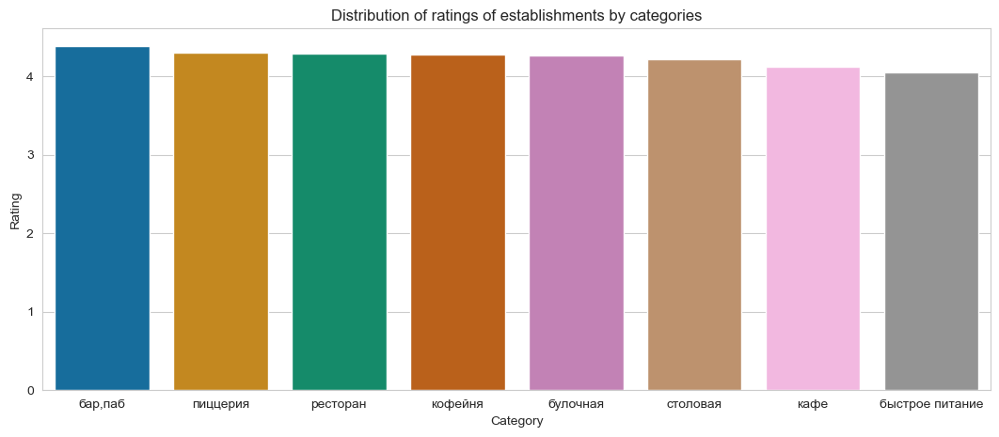

In [50]:
plt.figure(figsize=(13,5))
ax = sea.barplot(data=data.groupby('category')['rating'].mean().reset_index().sort_values('rating', ascending=False),
            x='category', 
            y='rating')
plt.title("Distribution of ratings of establishments by categories")
plt.xlabel("Category")
plt.ylabel("Rating")
plt.show()

Ratings of establishments of different types do not differ much, all are definitely above 4.0. 

Fast food has the lowest rating, but it is understandable that the quality of cousine there is much lower. 

Bars has the higher rating, then for Pizzerias and Restaurants. 

### 3.8. Cartogram of average rating by regions<a class="anchor" id="third8"></a>

Let's make a choropleth with an average rating of establishments in each district. Borders of Moscow district, that are used in the dataset, are stored in the file admin_level_geomap.geojson.


In [51]:
# read the file and save it to a variable

with open('/Users/lqbaha/Downloads/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [52]:
from folium import Map, Choropleth

# load the JSON file with borders of the districts of Moscow
state_geo = '/Users/lqbaha/Downloads/datasets/admin_level_geomap.geojson'

# moscow_lat - Moscow center latitude, moscow_lng - Moscow center longitude
moscow_lat, moscow_lng = 55.751244, 37.618423

# create a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create a choropleth using the constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Average rating of establishments by districts',
).add_to(m)

# show the map
m

We have the highest ratings in the North-Eastern district. 

The lowest in the Eastern, a little better- the Central and South Administrative district. 

The rest of the districts are all on the same good average level. 


### 3.9. Add establishments using clusters<a class="anchor" id="third9"></a>

In [53]:
from folium import Map, Marker
from folium.plugins import MarkerCluster

# create a map of Moscow
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# make an empty cluster, add it to the map
marker_cluster = MarkerCluster().add_to(m1)

# make a function that takes a dataset row, 
# creates a marker at the current point, and adds it to the marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)
    
Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Average rating of establishments by districts',
).add_to(m1)    

# apply finction create_clusters() to each row of dataset
data.apply(create_clusters, axis=1)
    
# show the map
m1

### 3.10. Top-15 streets by number of establishments<a class="anchor" id="third10"></a>

In [54]:
data_top15_street = data.groupby(['street']).agg(
    {'index' : 'count'}).sort_values(
    by='index', ascending=False).head(15).reset_index()
data_top15_street

,street,index
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


It can be said right away that the streets with the largest number of establishments are the longest or the largest streets. Prospekt Mira alone is 9 km, and the Moscow Ring Road - 109 km, although the roadside area actually used for food facilities is not so large. 

In [55]:
#make a list with the names of the top-15 streets

top15_list_street = list(data_top15_street['street'])

In [56]:
#create a dataset with information about districts, categories and number of establishments


data_street_category = data.query(
    'street in @top15_list_street').groupby(['street', 'category'])['index'].agg('count')\
                                       .reset_index()
data_street_category.sort_values(by='index', ascending=False)

,street,category,index
93,проспект Мира,кафе,53
63,МКАД,кафе,45
96,проспект Мира,ресторан,45
94,проспект Мира,кофейня,36
70,Профсоюзная улица,кафе,35
...,...,...,...
58,Люблинская улица,пиццерия,1
83,проспект Вернадского,булочная,1
23,Кутузовский проспект,булочная,1
66,МКАД,столовая,1


In [57]:
#calculate the percentage

percentage_data_street = data.query('street in @top15_list_street').groupby(['street', 'category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0: 'percentage'})

In [58]:
#merge two new datasets together

data_street_category = pd.merge(
    data_street_category, percentage_data_street, how='left', on=['street', 'category'])

In [59]:
#make a visualization

fig = px.bar(percentage_data_street,
             y='street',
             x='percentage',
             color='category',
             title='Distribution of the number of establishments by top-15 streets',
             width=1000,
             height=500, 
             color_discrete_sequence=[
                 px.colors.qualitative.Alphabet[20],
                 px.colors.qualitative.Alphabet[13],
                 px.colors.qualitative.Plotly[5],
                 px.colors.qualitative.Pastel[0],
                 px.colors.qualitative.Pastel[2],
                 px.colors.qualitative.Pastel[3],
                 px.colors.qualitative.G10[5], 
                 px.colors.qualitative.G10[8]])

fig.update_layout(
    title='Types of establishments by street, %',
    yaxis_title="Street",
    xaxis_title="Number of establishments",
    yaxis=dict(
        tickmode='array',
        tickvals=percentage_data_street['street'],
        ticktext=percentage_data_street['street']
    ),
    legend_title=''
)
fig.show()

The Moscow Ring Road has the largest number of Cafes (apparently, roadsides ones), and the the smallest number of Bars which is logical). 

There are more Restaurants on Leningradskoe shosse and Vernadskogo avenue (very elite streets).

It is interesting that there are no eatries and bakeries on Miklukho-Maklaya street at all.

### 3.11. Street with only one establishment<a class="anchor" id="third11"></a>

In [60]:
data_1_place_street = data.pivot_table(
    index = ['street'],
    values = 'index', 
    aggfunc = 'count').reset_index()

print('The number of street where there is only one catering facility: ', 
      len(data_1_place_street.query('index == 1')))

The number of street where there is only one catering facility:  458


It can be assumed thet the establishments that are in the singular on the street are located on small streets, gateways and sleeping areas. And basically there are not chained. 

### 3.12. Average bill by regions<a class="anchor" id="third12"></a>
The values of average bills presented in the `middle_avg_bill` column, but we remember, that the percentage of missing values in this column is 63%, so we use the median value. 

These numbers show the approximate cost of the orded in rubles, which is most often expressed as a range. Calculate the median of this column for each district. And we will use this value  as a price indicator for this district. 

In [61]:
median_mid_bil_dis = data.groupby('district')['middle_avg_bill'].median().reset_index().sort_values(
    'middle_avg_bill', ascending=False)
median_mid_bil_dis

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Will make a Choropleth with the obtained values for each district. 

In [62]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create a choropleth using the constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=median_mid_bil_dis,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Median bill by districts',
).add_to(m2)

# show the map
m2

The highest median bill is in the Central and the Western (Moscow State University, Vernadskogo avenue, Kuntsevo, so it's one of the richest and the most elite areas), CAO - is logical and understandable. 

The South-Eastern, North-Eastern and Southern districts are the districts with the lowest median prices, but here we also need to remember about the number of establishments and their ratings. 


### 3.13. EDA conclusions<a class="anchor" id="third13"></a>

In total we have 8 **categories of catering establishments**:
* cafe, amount 2378 (smaller and simpier than restaurant, less cloice, coffee-snacks-lunches). Have 28,3% of the researched area.
* restaurant, amount 2043 (higher level of service and food quality, focus on longer stays), 24,3%. 
* coffee shop, кол-во 1413 (focus on coffee and pastires, often take-away orders), 16,8%.
* bar, pub, amount 765 (alcohol specialization), 9,1%.
* pizzeria, amount 633 (restaurant/cafe with one type of food), 9%. 
* fast food, amount 603 (often takeaway orders, are concentrated in shopping centers), 7,5%. 
* eatery, amount 315 (self-service catering format, unlike fast food - the cousien is more like home), 3,75%.
* bakery, amount 256 (specialization in baking, but recently bakeries have become like coffee houses in reverse: more pastries, less coffee), 3%. 


The most **number of seats** is required for establishments such as Restaurant, Bar/Pub, Coffee Shop and Eatery (80).

And less if for Fast Food, Cafes, Pizzerias and Bakeries (that these categories are often for takeaway).


There are more **non-chain** stablishments than chain ones in the ration of 62% to 38%.


**The chain establishments are most often**:
- Bakery
- Pizzeria
- Coffee shop
- Fast food


In total we have 816 establishments in the **top-15 chains** in Moscow, which is about 10% of the entire dataset. 

All of them spezialize in residents of the megacity, who have no time to cook, and food is needed for the office, food is needed at home, food can be easily and affordably get. 


Out total rating: 

- Chocoladnitsca - huge chain with business lunches, coffee and quiet atmosphere
- Domino's pizza - focus on delivery
- Dodo pizza - focus on delivery
- One Price Coffee - takeaway coffee
- Yandex Lavka - food and grocery delivery
- Cofix - takeaway coffee
- Prime - healthy and unusual type for office lunches
- Khinkalnaya - a georgian cousine chain with beautiful and delicious restaurants, but this format is also very often ordered with delivery
- Coffeeport - takeaway coffee
- Culinary shop of the Karavaev brothers - very nice and tasty format of eatery
- Teremok - russian folk fast food
- Chaihana - like a khinkalnaya, very popular and also delivery
- CofeFest - takeaway coffee
- Buhanka - bakery + takeaway coffee
- Mu-Mu - eatery


**Distribution of chain establishments by categories**:

* 42% - Coffee shops,
* 23% - Restaurants,
* 19% - Pizzas,
* and 12,5% - Caffee.
But we noticed that different places of the same chain appear in different categories.

And for example, Yandex Lavka, which works only for the delivery products, is considered a restaurant.


**Administrative districts** presented in the following format: a querter of all establishments are located in Central Administrative District, and in all other areas relatively evenly:
* Central Administrative District       --  2242
* Northern Administrative District      --   900
* Southe Administrative District        --   892
* Northeastern Administrative District  --   891
* Western Administrative District       --   851
* Eastern Administrative District       --   798
* Southeast Administrative District     --   714
* Southwestern Administrative District  --   709
* Northwestern Administrative District  --   409



Chain bakeries are not represented at all in the Southern and South-Eastern regions.

There are practically no eateries anywhere, except for the Eastern and Central regions.

Bars are represented to a greater extent in the Southwestern, Eastern, and Central regions.

The distribution of Restaurants, Pizzerias and Caffee shops is approximately the same in all regions (except for the CAO, there are very few pizzerias there)



**Ratings of establishments of different types** do not differ much, all are definitely above 4.0.
* Fast food has the lowest rating, but it is understandable that the quality of cousine there is much lower.
* Bars has the higher rating, then for Pizzerias and Restaurants.


We have the highest **ratings** in the North-Eastern district. The lowest in the Eastern, a little better- the Central and South Administrative district. The rest of the districts are all on the same good average level.


It can be said right away that the **streets with the largest number of establishments** are the longest or the largest streets. Prospekt Mira alone is 9 km, and the Moscow Ring Road - 109 km, although the roadside area actually used for food facilities is not so large.


The Moscow Ring Road has the largest number of Cafes (apparently, roadsides ones), and the the smallest number of Bars which is logical).
There are more Restaurants on Leningradskoe shosse and Vernadskogo avenue (very elite streets).
It is interesting that there are no eatries and bakeries on Miklukho-Maklaya street at all.


The number of street where there is only one catering facility:  458


It can be assumed thet the **establishments that are in the singular on the street** are located on small streets, gateways and sleeping areas. And basically there are not chained.


**Average bill by regions**
The highest median bill is in the Central and the Western (Moscow State University, Vernadskogo avenue, Kuntsevo, so it's one of the richest and the most elite areas), CAO - is logical and understandable. 

The South-Eastern, North-Eastern and Southern districts are the districts with the lowest median prices, but here we also need to remember about the number of establishments and their ratings. 



## 4. Detailing research: opening a coffee shop<a class="anchor" id="fourth"></a>

Our clients - the founders of the «Shut Up and Take My Money» Foundation, dream of having a coffe shop like in the TV series Friends. Let's try to determine if their dream can be realized. 

We will answer the following questions: 
* How many coffee shops are in the dataset? Which areas have the most of them, what are the features of their location?
* Are there 24 hour coffee shops? 
* What are the rating of coffee shops? How are they distributed across districts? 
* What is the cost of a cuppuccino cup during the start time and why? 


In [63]:
cafe_data = data.query('category == "кофейня"')

In [64]:
cafe_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              1413 non-null   int64  
 1   name               1413 non-null   object 
 2   category           1413 non-null   object 
 3   address            1413 non-null   object 
 4   district           1413 non-null   object 
 5   hours              1398 non-null   object 
 6   lat                1413 non-null   float64
 7   lng                1413 non-null   float64
 8   rating             1413 non-null   float64
 9   price              476 non-null    object 
 10  avg_bill           721 non-null    object 
 11  middle_avg_bill    200 non-null    float64
 12  middle_coffee_cup  521 non-null    float64
 13  chain              1413 non-null   bool   
 14  seats              751 non-null    float64
 15  street             1413 non-null   object 
 16  is_24/7            1398 

In [65]:
colors = ['lightblue', 'darkred']

fig = go.Figure(data=[go.Pie(
    labels=['Non-chain', 'Chain'], 
    values=cafe_data['chain'].value_counts().to_list(),
    pull=[0.1, 0])])
fig.update_layout(
    title_text="The ratio of chain and non-chain establishments")

fig.update_traces(marker=dict(
                  colors=colors))

fig.show() 

We have a total of 1413 coffee shops in our dataset, with the chain/non-chain market split roughly evenly. 

In [66]:
data_district = cafe_data.groupby(['district']).agg(
    {'index' : 'count'}).sort_values(
    by='index', ascending=False).reset_index()
data_district['share'] = round(data_district['index'] / data_district['index'].sum() * 100, 2)
data_district

,district,index,share
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


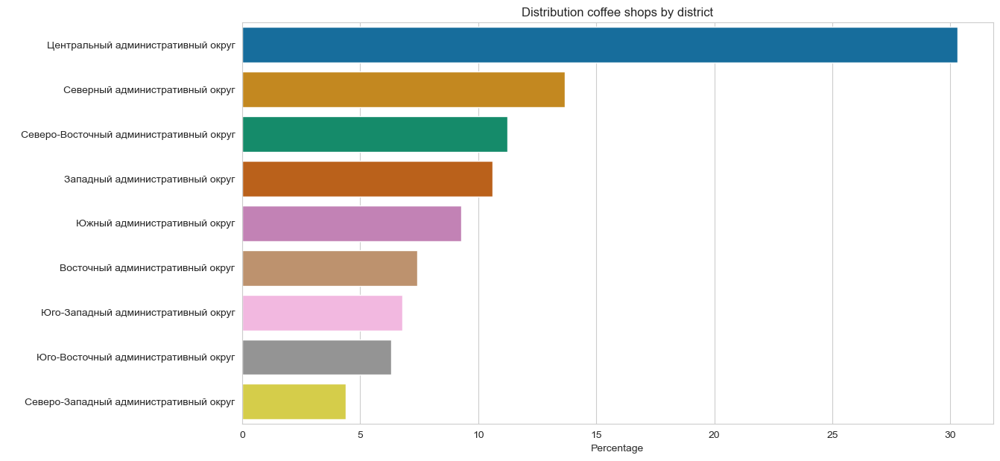

In [67]:
plt.figure(figsize=(13,7))
ax = sea.barplot(data=data_district.sort_values('share', ascending=False), 
            y='district', 
            x='share')

plt.title("Distribution coffee shops by district")
plt.xlabel("Percentage")
plt.ylabel(" ")
plt.show()

Logically, the most coffee shops (30%) are located in the Cental Administrative District and 13,7% in the Northern. 

The least in the South-Eastern (6,3%) and only 4,4% in the North-West AD. 

Now let's look at the placement on the map (removing the chain establishments).

In [68]:
colors = ['turquoise', 'magenta', 'darkblue', 'lightblue', 'lightcyan', 'darkred', 'royalblue', 'pink', 'darkgreen']

fig = go.Figure(data=[go.Pie(labels=data_district['district'], 
                             values=data_district['index'])])

fig.update_traces(marker=dict(
                  colors=colors))

fig.update_layout(
    title_text="Ratio of coffee shops by districts")
fig.show() 

In [69]:
cafe_data_org = cafe_data.query('chain == False')

In [70]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create an ampty cluster, add it to the map
marker_cluster = MarkerCluster().add_to(m3)

# apply the create_cluster function to each row of dataset
cafe_data_org.apply(create_clusters, axis=1)
    
# show the map
m3

Indeed, in Central AD (even though the area is smaller), there are a lot more coffee shops. In the rest of the city, establishments are located on the most popular streets, congregating near the metro stations. 

We also colored the map by average rating by district, with the best service in the North-Estern District, followerd by the South-Eastern District in second place.  

In [71]:
cafe_data_org['rating'].describe()

count    693.000000
mean       4.350505
std        0.371671
min        1.400000
25%        4.200000
50%        4.400000
75%        4.600000
max        5.000000
Name: rating, dtype: float64

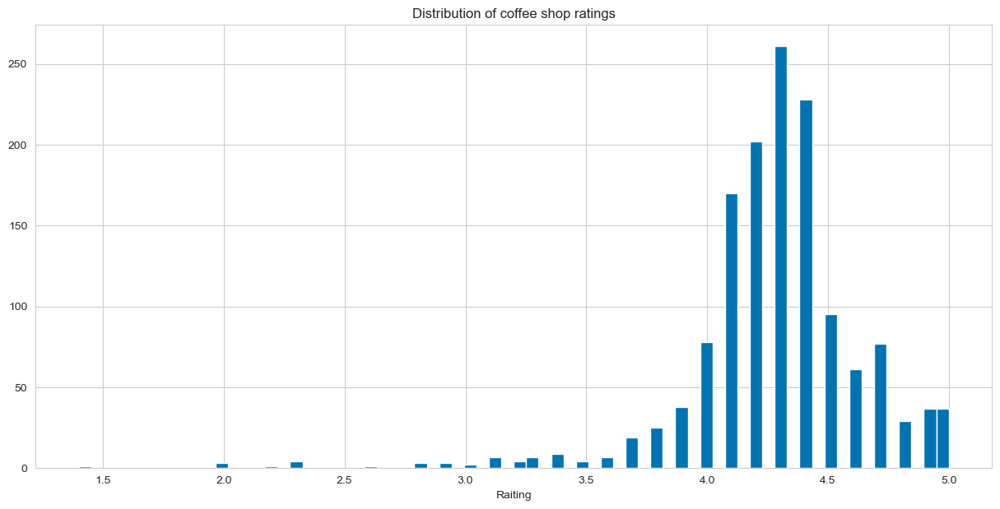

In [72]:
plt.figure(figsize = (15, 7))
cafe_data['rating'].hist(bins = 70)
plt.title("Distribution of coffee shop ratings") 
plt.xlabel('Raiting')
plt.show()

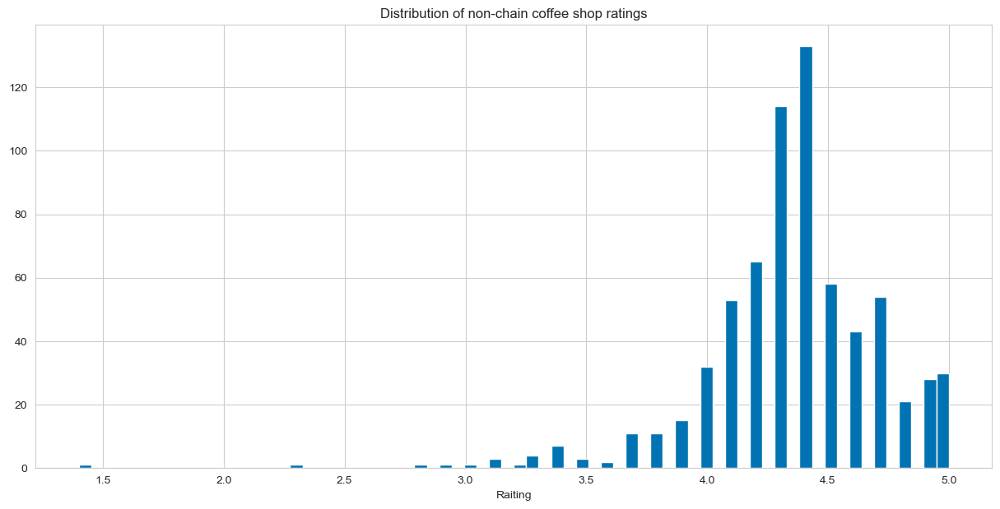

In [73]:
plt.figure(figsize = (15, 7))
cafe_data_org['rating'].hist(bins = 70)
plt.title("Distribution of non-chain coffee shop ratings") 
plt.xlabel('Raiting')
plt.show()

Rating of coffee shops have a normal distribution with an average of 4,35 for non-chain and in principle most with rating about 4,0. 

There are single very low ratings at 1,4 and 2,3. 

In [74]:
cafe_data_org['seats'].describe()

count     342.000000
mean       98.970760
std       123.510358
min         0.000000
25%        30.000000
50%        60.000000
75%       120.000000
max      1288.000000
Name: seats, dtype: float64

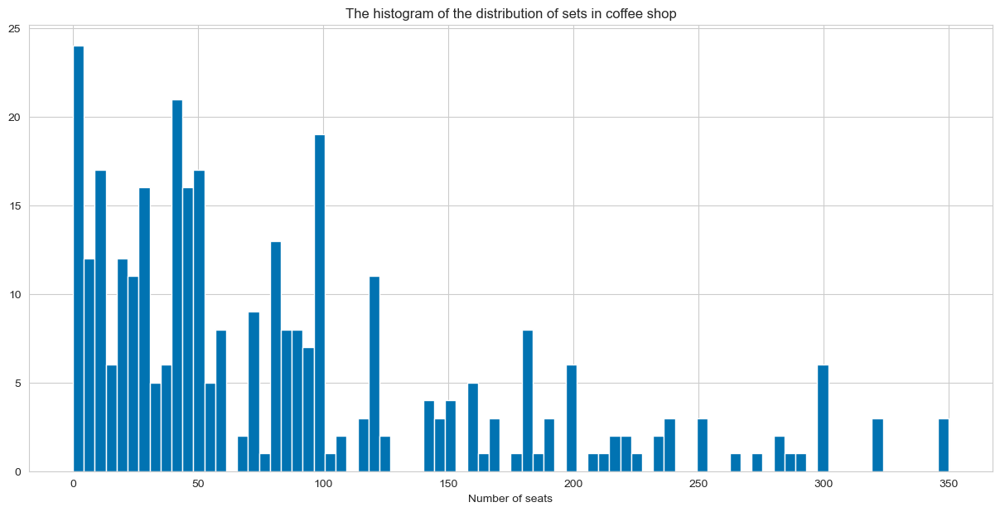

In [75]:
plt.figure(figsize = (15, 7))
cafe_data_org['seats'].hist(bins = 80, range=[0, 350])
plt.title("The histogram of the distribution of sets in coffee shop") 
plt.xlabel('Number of seats')
plt.show()

The average number of seats in a non-chain caffee shop if 100. 

Let's see if there are any 24/7 coffee shops. 

In [76]:
cafe_data_org['is_24/7'].describe()

count       684
unique        2
top       False
freq        675
Name: is_24/7, dtype: object

In [77]:
colors = ['darkred', 'lightblue']

fig = go.Figure(data=[go.Pie(
    labels=['Not 24/7', '24/7'], 
    values=cafe_data_org['is_24/7'].value_counts().to_list(),
    pull=[0.1, 0])])
fig.update_layout(
    title_text="Ratio of establishment: 24/7 or not")

fig.update_traces(marker=dict(
                  colors=colors))

fig.show() 

We can see that there are hardly any 24-hour coffee shops. It's not the right format after all. In the Friends series, Central park wasn't a 24-hour either (but the bar that was in its place before is another matter). 

Now let's look at the price of a one cappuccino cup (but remember that we have a lot of missing values in these columns, we'd better look at them all).

In [78]:
cafe_data_org['price'].describe()

count         276
unique          4
top       средние
freq          226
Name: price, dtype: object

Most of the prices are 'average', but that's not suprising. Moving on. 

In [79]:
cafe_data_org['avg_bill'].describe()

count                               371
unique                              228
top       Цена чашки капучино:200–250 ₽
freq                                  9
Name: avg_bill, dtype: object

In [80]:
cafe_data_org['middle_avg_bill'].describe()

count     108.000000
mean      491.120370
std       330.827615
min       120.000000
25%       275.000000
50%       381.000000
75%       600.000000
max      1750.000000
Name: middle_avg_bill, dtype: float64

In [81]:
cafe_data_org['middle_coffee_cup'].describe()

count    263.000000
mean     177.300380
std       51.882548
min       60.000000
25%      139.500000
50%      170.000000
75%      210.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

The average price of a cup of coffee is 170-210 rubles. 

The average bill a total is 380 rubles (apparently plus a bun). 

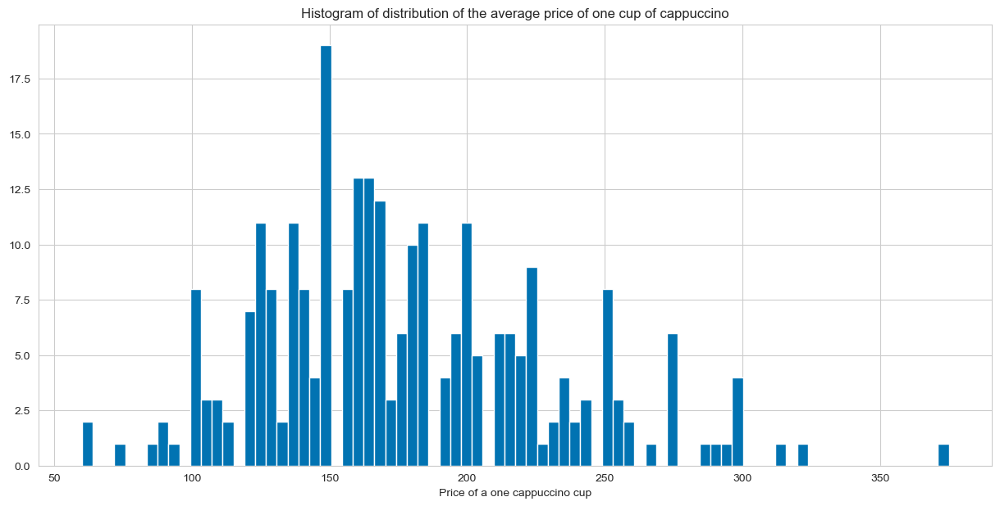

In [82]:
plt.figure(figsize = (15, 7))
cafe_data_org['middle_coffee_cup'].hist(bins = 80)
plt.title("Histogram of distribution of the average price of one cup of cappuccino") 
plt.xlabel('Price of a one cappuccino cup')
plt.show()

With opening, you can be oriented on the average price of a cappuccino in the city, but with additional attractive promotions. 

Like Shokoladnitca had a flyer format for a long time - "Two cappuccinos for the price of one", this can be afforded by students on a date, and freelancers working in Caffe and even schoolchildren. 


The price, of course, should not be lower than the production cost, but the main thing to keep in mind is that if the coffee doesn't taste good, no one will buy it even for 100 rubles. 


### 4.1. Conclusion about opening a coffee shop<a class="anchor" id="fourth1"></a>

We can give recommendations for opening a coffee shop in the style of Friends. 

**Location:**
*	Eastern district
*	Western
*	Southeastern

These areas have a very small percentage of coffee shops, and pay attention to the area near city parks (Sokolniki,	Kuzminki, Lefortovo, Victiry Park and Matveevsky forest). 

There are almost no coffee houses in the park themselves, and those that do exist are banal coffee cart, but after a long walk everyone wants to drink some coffee and sit cosy, warmed up. 

You can also consider the territory near universities, who else needs a quiet place, a lot of coffee and the style of their favorite series? 

* In these areas, quality is also an adventage. 
* The recommended average number of seats is 100.
* Making a 24-hour coffee shop hardly makes sense. 


And the initial price can be set at the city level of 180-200 rubles, but adding formats on customer return.  

In [83]:
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create a choropleth using the constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=cafe_data_org,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Average rating of coffee shops by districts',
).add_to(m4)

# save the coordinates of the recommended locations into variables
sokolniki_lat, sokolniki_theatre_lng = 55.7962627, 37.6839046
lefortovo_lat, lefortovo_lng = 55.759936, 37.690938
few_university_lat, few_university_lng = 55.78324, 37.6146286
pobedy_park_lat, pobedy_park_lng = 55.725638, 37.479301
kuzminki_park_lat, kuzminki_park_lang = 55.6964989, 37.762896


# create a marker at the location poins and add it to the map
folium.Marker([sokolniki_lat, sokolniki_theatre_lng]).add_to(m4)
folium.Marker([lefortovo_lat, lefortovo_lng]).add_to(m4)
folium.Marker([few_university_lat, few_university_lng]).add_to(m4)
folium.Marker([pobedy_park_lat, pobedy_park_lng]).add_to(m4)
folium.Marker([kuzminki_park_lat, kuzminki_park_lang]).add_to(m4)

    
# show the map
m4

## 5. Presentation "Moscow research to choose a new location for a coffee shop."<a class="anchor" id="fifth"></a>


try: 
    [link](https://cloud.mail.ru/public/At24/fdrCKTEyE)
   
except:
    [link](https://cloud.mail.ru/public/jc3j/MuJ3E5jn7)